### Creación de RN simple con una conexión sináptica
la idea fue modelizar la red como una clase para que se reutilice entre todos los optimizadores y que los valores iniciales de los hiperparametros, sean identicos para los 3 experimentos, de manera que la variabilidad solo dependa de los optimizares en sí. 

In [567]:
import numpy as np
import matplotlib.pyplot as plt

# Inicialización aleatoria única y compartida por GD y Adam.
SEMILLA_INICIAL = 42
np.random.seed(SEMILLA_INICIAL)
W0 = np.random.randn(1, 1)
B0 = np.random.randn(1, 1)
print(f'Inicialización compartida: w0={W0.item():.4f}, b0={B0.item():.4f}')

class RedNeuronalSimple:
    def __init__(self, w_inicial, b_inicial):
        # Cada optimizador recibe copias del mismo punto inicial.
        self.w_init = np.copy(w_inicial)
        self.b_init = np.copy(b_inicial)
        self.reiniciar_parametros()

    def reiniciar_parametros(self):
        """Devuelve la red a su estado inicial antes de entrenar."""
        self.w = np.copy(self.w_init)
        self.b = np.copy(self.b_init)
        # Inicializamos los momentos de ADAM en 0
        self.m_w, self.v_w = 0, 0
        self.m_b, self.v_b = 0, 0

    def forward(self, X):
        """Paso hacia adelante: Z = wX + b, A = tanh(Z)"""
        Z = np.dot(self.w, X) + self.b
        A = np.tanh(Z)
        return A

    def backward(self, X, Y, A):
        """Paso hacia atrás: Calcula y devuelve los gradientes dw y db"""
        m = X.shape[1]
        dA = 2 * (A - Y) / m
        dZ = dA * (1 - np.power(A, 2))
        dw = np.dot(dZ, X.T)
        db = np.sum(dZ, axis=1, keepdims=True)
        return dw, db

    def actualizar_sgd(self, dw, db, lr):
        """Actualización tradicional del Descenso de Gradiente"""
        self.w -= lr * dw
        self.b -= lr * db

    def actualizar_adam(self, dw, db, lr, t, beta1=0.9, beta2=0.999, epsilon=1e-8):
        """Actualización usando el optimizador ADAM"""
        self.m_w = beta1 * self.m_w + (1 - beta1) * dw
        self.m_b = beta1 * self.m_b + (1 - beta1) * db
        self.v_w = beta2 * self.v_w + (1 - beta2) * (dw**2)
        self.v_b = beta2 * self.v_b + (1 - beta2) * (db**2)

        m_w_corr = self.m_w / (1 - beta1**t)
        m_b_corr = self.m_b / (1 - beta1**t)
        v_w_corr = self.v_w / (1 - beta2**t)
        v_b_corr = self.v_b / (1 - beta2**t)

        self.w -= lr * m_w_corr / (np.sqrt(v_w_corr) + epsilon)
        self.b -= lr * m_b_corr / (np.sqrt(v_b_corr) + epsilon)

    def entrenar(self, X, Y, epocas, lr, optimizador='sgd', tamano_lote=64):
        self.reiniciar_parametros()
        historial_costo = []
        historial_w = []
        historial_b = []
        m_total = X.shape[1]

        t = 1 # Contador global de actualizaciones para ADAM
        rng_lotes = np.random.default_rng(SEMILLA_INICIAL)

        for epoca in range(epocas):
            if optimizador == 'adam_minibatch':
                # 1. Mezclar datos aleatoriamente en cada época
                permutacion = rng_lotes.permutation(m_total)
                X_mezclado = X[:, permutacion]
                Y_mezclado = Y[:, permutacion]

                # 2. Iterar sobre los mini-lotes
                for i in range(0, m_total, tamano_lote):
                    X_lote = X_mezclado[:, i:i+tamano_lote]
                    Y_lote = Y_mezclado[:, i:i+tamano_lote]

                    # Gradiente y actualización calculados sobre el mini-lote.
                    A_lote = self.forward(X_lote)
                    dw, db = self.backward(X_lote, Y_lote, A_lote)
                    self.actualizar_adam(dw, db, lr, t)
                    t += 1 # Actualizamos 't' en cada mini-lote
            else:
                # Full-Batch clásico (todo el dataset de una vez)
                A = self.forward(X)
                dw, db = self.backward(X, Y, A)
                if optimizador == 'gd':
                    self.actualizar_sgd(dw, db, lr)
                elif optimizador == 'adam':
                    self.actualizar_adam(dw, db, lr, t)
                    t += 1

            # Mismo MSE para las tres variantes: todo el dataset al finalizar la época.
            A_total = self.forward(X)
            historial_costo.append(np.mean((A_total - Y)**2))
            historial_w.append(self.w[0, 0])
            historial_b.append(self.b[0, 0])

        return historial_w, historial_b, historial_costo



Inicialización compartida: w0=0.4967, b0=-0.1383


Definimos un data set ramdom, pero que no sea lineal y además que contenga ruido, de está manera buscamos forzar a los optimizadores a que no caigan en una simple regresión lineal.

n = 300, rango de X: [-3.0, 3.0]
rango de Y: [-0.589, 0.955]


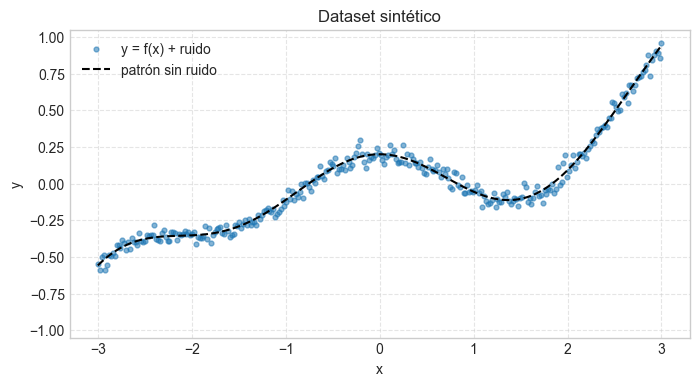

In [568]:
# ==========================================
# 2. DEFINICIÓN DEL DATASET SINTÉTICO
# ==========================================
# x simétrico y patrón no lineal distinto de tanh, acotado en [-1, 1].
rng = np.random.default_rng(42)
X = np.linspace(-3, 3, 300).reshape(1, -1)
Y_sin_ruido = 0.75 * (X / 3) ** 3 + 0.20 * np.cos(2 * X)

# Ruido normal de baja magnitud sobre el patrón no lineal.
Y = np.clip(Y_sin_ruido + rng.normal(0, 0.04, size=X.shape), -1, 1)

print(f'n = {X.shape[1]}, rango de X: [{X.min():.1f}, {X.max():.1f}]')
print(f'rango de Y: [{Y.min():.3f}, {Y.max():.3f}]')
plt.figure(figsize=(8, 4))
plt.scatter(X.ravel(), Y.ravel(), s=12, alpha=0.55, label='y = f(x) + ruido')
plt.plot(X.ravel(), Y_sin_ruido.ravel(), 'k--', label='patrón sin ruido')
plt.ylim(-1.05, 1.05)
plt.xlabel('x'); plt.ylabel('y'); plt.title('Dataset sintético')
plt.legend(); plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

## GRADIENT DESCENT

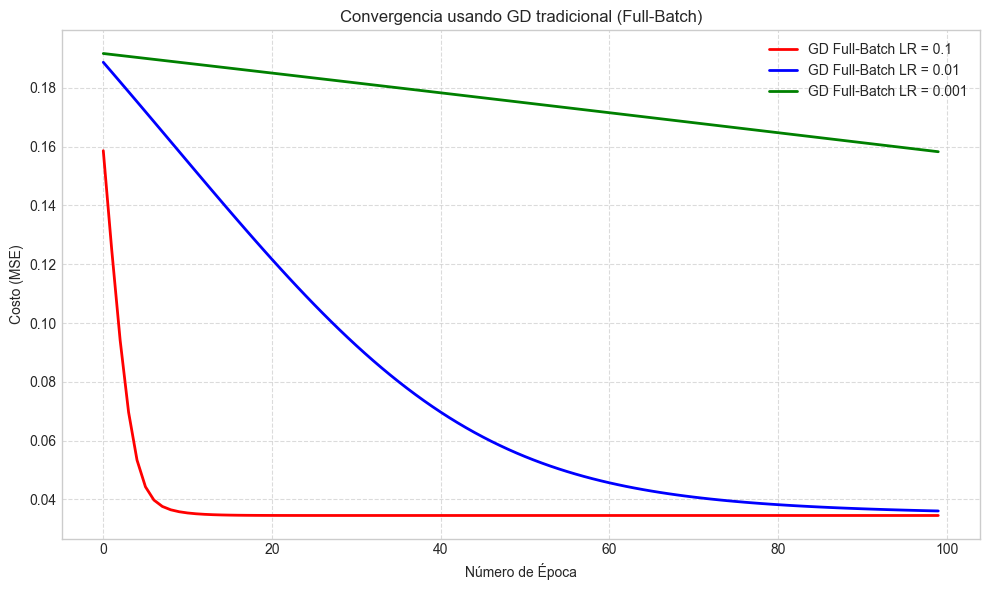

In [569]:
# ==========================================
# PRUEBA: DESCENSO DE GRADIENTE TRADICIONAL (FULL-BATCH)
# ==========================================

# Instanciamos la red (asume que X e Y ya están creados como en el paso anterior)
red_gd = RedNeuronalSimple(W0, B0)
tasas_aprendizaje = [0.1, 0.01, 0.001]
costos_sgd = []
w_hist_sgd = []
b_hist_sgd = []
epocas = 100

plt.figure(figsize=(10, 6))
colores = {0.1: 'red', 0.01: 'blue', 0.001: 'green'}

# Bucle para probar los distintos Learning Rates
for lr in tasas_aprendizaje:
    w_hist, b_hist, costos = red_gd.entrenar(X, Y, epocas, lr, optimizador='gd')
    costos_sgd.append(costos)
    w_hist_sgd.append(w_hist)
    b_hist_sgd.append(b_hist)

    plt.plot(range(epocas), costos,
             label=f'GD Full-Batch LR = {lr}',
             color=colores[lr],
             linewidth=2)

plt.title('Convergencia usando GD tradicional (Full-Batch)')
plt.xlabel('Número de Época')
plt.ylabel('Costo (MSE)')
plt.legend(loc='upper right', shadow=True)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Observaciones de la ejecución de descenso de gradiente

El dataset se construyó con entradas equiespaciadas en un rango simétrico, un patrón no lineal y ruido normal de baja magnitud.

En GD Full-Batch, `LR = 0.1` alcanza el menor MSE dentro de las 100 épocas. Con `LR = 0.01` el descenso es más lento y el MSE final queda levemente por encima. Con `LR = 0.001`, el costo disminuye, pero las 100 épocas no alcanzan para aproximarse al mismo valor mínimo observado con las tasas mayores.



## ADAM

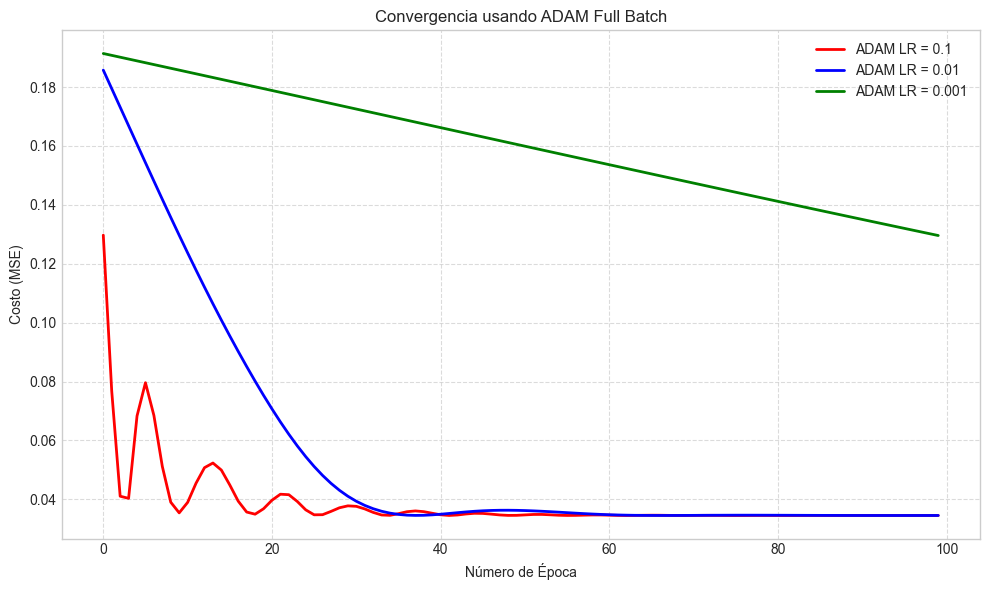

In [570]:
# ==========================================
# PRUEBA: Adam
# ==========================================

# 2. Instanciar la red
red = RedNeuronalSimple(W0, B0)
tasas_aprendizaje = [0.1, 0.01, 0.001]
costos_adam = []
w_hist_adam = []
b_hist_adam = []
epocas = 100

# 3. Entrenar y graficar en unas pocas líneas
plt.figure(figsize=(10, 6))
colores = {0.1: 'red', 0.01: 'blue', 0.001: 'green'}

for lr in tasas_aprendizaje:
    # Ahora podés entrenar pasando simplemente 'adam' o 'sgd'
    w_hist, b_hist, costos = red.entrenar(X, Y, epocas, lr, optimizador='adam')
    costos_adam.append(costos)
    w_hist_adam.append(w_hist)
    b_hist_adam.append(b_hist)

    plt.plot(range(epocas), costos, label=f'ADAM LR = {lr}', color=colores[lr], linewidth=2)

plt.title('Convergencia usando ADAM Full Batch')
plt.xlabel('Número de Época')
plt.ylabel('Costo (MSE)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Observaciones de la ejecución con Adam Full-Batch

Se observa que Adam Full-Batch con `LR = 0.1` presenta oscilaciones iniciales, pero al finalizar las 100 épocas alcanza el mismo menor MSE observado que GD Full-Batch.

Con `LR = 0.01`, alcanza su menor MSE cerca de la época 94. Finalmente, con `LR = 0.001`, el costo todavía continúa descendiendo al finalizar las 100 épocas, por lo que no llega a la misma región de MSE que las tasas mayores.

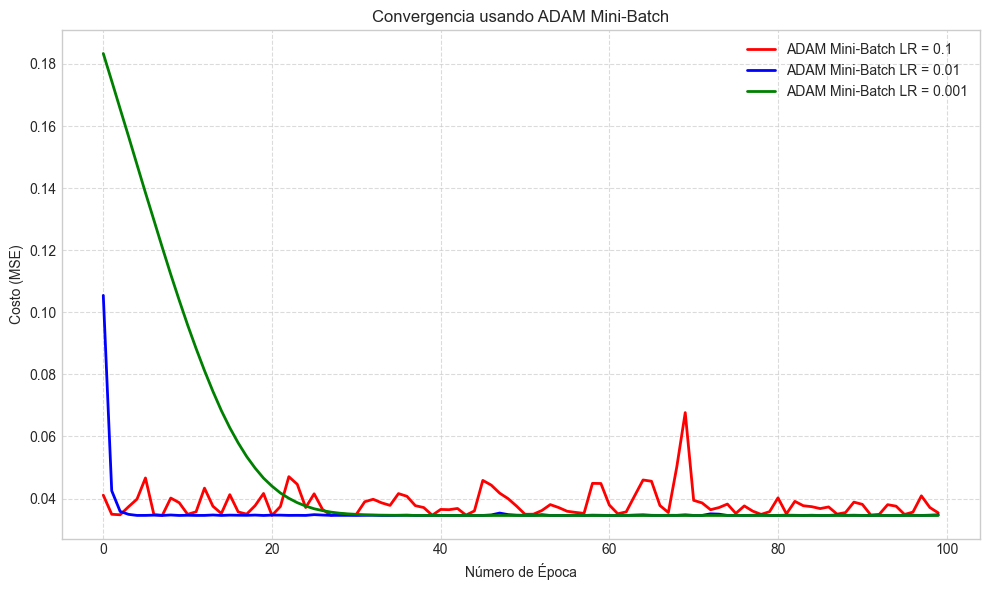

In [571]:
## ADAM MINI-BATCH (batch size = 20)
red = RedNeuronalSimple(W0, B0)
tasas_aprendizaje = [0.1, 0.01, 0.001]
costos_adam_mb = []

w_hist_mb = []
b_hist_mb = []
epocas = 100

plt.figure(figsize=(10, 6))
colores = {0.1: 'red', 0.01: 'blue', 0.001: 'green'}

# Bucle para probar los 3 Learning Rates superpuestos
for lr in tasas_aprendizaje:
    w_hist, b_hist, costos = red.entrenar(X, Y, epocas, lr, optimizador='adam_minibatch', tamano_lote=20)
    costos_adam_mb.append(costos)
    w_hist_mb.append(w_hist)
    b_hist_mb.append(b_hist)

    plt.plot(range(epocas), costos,
             label=f'ADAM Mini-Batch LR = {lr}',
             color=colores[lr],
             linewidth=2)

plt.title('Convergencia usando ADAM Mini-Batch')
plt.xlabel('Número de Época')
plt.ylabel('Costo (MSE)')
plt.legend(loc='upper right', shadow=True)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Observaciones de la ejecución con Adam Mini-Batch

Con Adam Mini-Batch, los tres learning rates alcanzan valores de MSE cercanos dentro de las 100 épocas. Por lo tanto, el learning rate no modifica sustancialmente la solución final observada en este experimento, pero sí influye en la cantidad de épocas necesarias para aproximarse a ella y en la estabilidad de la curva de costo una vez alcanzada.

### Comparación de Modelos por Learning Rate

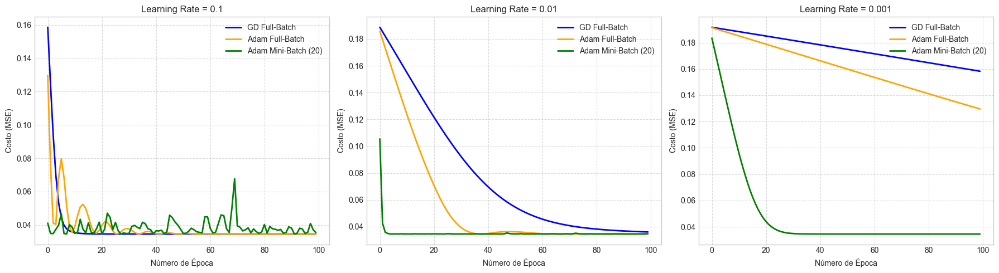

In [572]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, lr in enumerate(tasas_aprendizaje):
    ax = axes[idx]

    ax.plot(costos_sgd[idx], label='GD Full-Batch', color='blue', linewidth=2)
    ax.plot(costos_adam[idx], label='Adam Full-Batch', color='orange', linewidth=2)
    ax.plot(costos_adam_mb[idx], label='Adam Mini-Batch (20)', color='green', linewidth=2)

    ax.set_title(f'Learning Rate = {lr}')
    ax.set_xlabel('Número de Época')
    ax.set_ylabel('Costo (MSE)')
    ax.legend(loc='upper right', shadow=True)
    ax.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Tabla comparativa de convergencia y estabilidad

Para comparar de manera justa, el MSE de cada método se calcula sobre los 300 ejemplos al finalizar cada época. En mini-batch se realizan 15 actualizaciones por época (`300 / 20`). La columna *Mejor época* indica dónde se observó el menor MSE, no necesariamente una convergencia definitiva si la curva continúa oscilando.

In [573]:
import pandas as pd

configuraciones_tabla = [
    ('GD Full-Batch', costos_sgd, 1),
    ('Adam Full-Batch', costos_adam, 1),
    ('Adam Mini-Batch (20)', costos_adam_mb, int(np.ceil(X.shape[1] / 20)))
]

filas_tabla = []
for nombre, costos_modelo, actualizaciones_por_epoca in configuraciones_tabla:
    for lr, costos in zip(tasas_aprendizaje, costos_modelo):
        costos = np.asarray(costos)
        mejor_epoca = int(np.argmin(costos)) + 1
        filas_tabla.append({
            'Modelo': nombre,
            'Learning rate': lr,
            'Mejor época (MSE)': mejor_epoca,
            'Actualizaciones hasta esa época': mejor_epoca * actualizaciones_por_epoca,
            'Menor MSE observado': costos.min(),
            'MSE final': costos[-1],
            'Desv. MSE últimas 20 épocas': costos[-20:].std()
        })

tabla_comparativa = pd.DataFrame(filas_tabla)
display(tabla_comparativa.style.format({
    'Learning rate': '{:.3f}',
    'Menor MSE observado': '{:.6f}',
    'MSE final': '{:.6f}',
    'Desv. MSE últimas 20 épocas': '{:.6f}'
}).hide(axis='index'))

Modelo,Learning rate,Mejor época (MSE),Actualizaciones hasta esa época,Menor MSE observado,MSE final,Desv. MSE últimas 20 épocas
GD Full-Batch,0.100,95,95,0.034534,0.034534,0.000000
GD Full-Batch,0.010,100,100,0.036073,0.036073,0.000643
GD Full-Batch,0.001,100,100,0.158262,0.158262,0.001963
Adam Full-Batch,0.100,100,100,0.034534,0.034534,0.000004
Adam Full-Batch,0.010,94,94,0.034534,0.034539,0.000026
Adam Full-Batch,0.001,100,100,0.129580,0.129580,0.003519
Adam Mini-Batch (20),0.100,21,315,0.034547,0.035376,0.001809
Adam Mini-Batch (20),0.010,86,1290,0.034535,0.034745,0.000054
Adam Mini-Batch (20),0.001,59,885,0.034534,0.034535,0.000002


### Ajuste final sobre el dataset sintético (9 configuraciones)

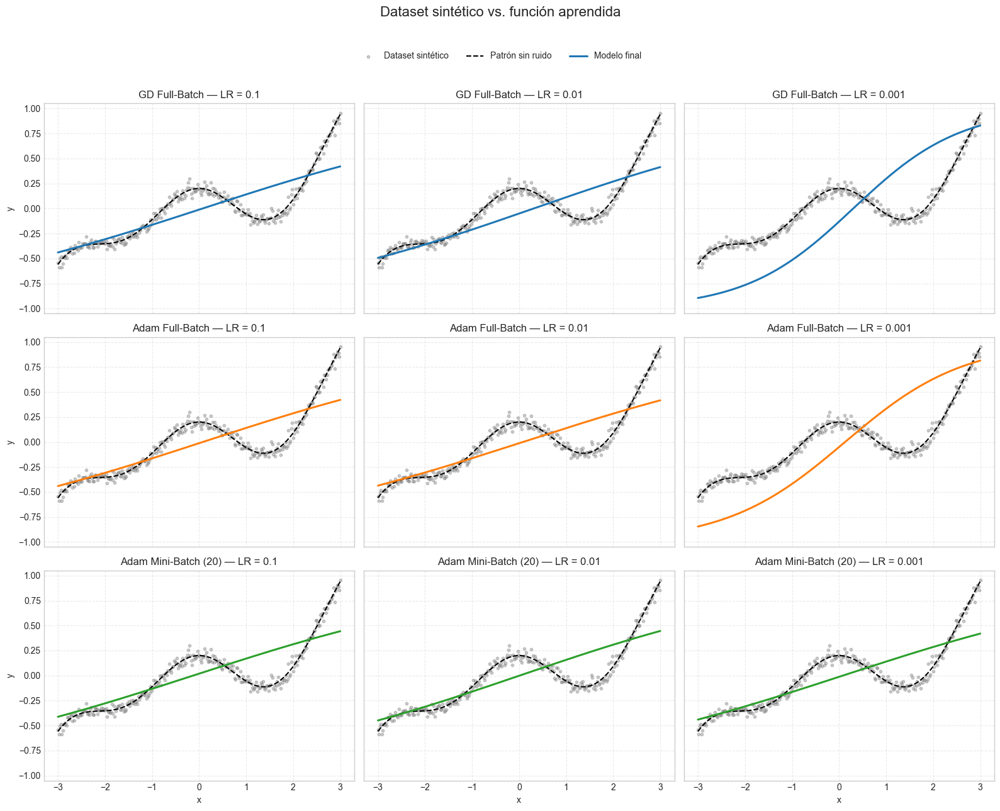

In [574]:
# Cada fila es un optimizador y cada columna un learning rate.
# Se recuperan w y b de la última época de cada entrenamiento.
configuraciones = [
    ('GD Full-Batch', w_hist_sgd, b_hist_sgd, 'tab:blue'),
    ('Adam Full-Batch', w_hist_adam, b_hist_adam, 'tab:orange'),
    ('Adam Mini-Batch (20)', w_hist_mb, b_hist_mb, 'tab:green')
]

fig, axes = plt.subplots(3, 3, figsize=(16, 12), sharex=True, sharey=True)

for fila, (nombre, historiales_w, historiales_b, color) in enumerate(configuraciones):
    for columna, lr in enumerate(tasas_aprendizaje):
        ax = axes[fila, columna]
        w_final = historiales_w[columna][-1]
        b_final = historiales_b[columna][-1]
        y_predicha = np.tanh(w_final * X + b_final)

        ax.scatter(X.ravel(), Y.ravel(), s=10, alpha=0.40, color='gray', label='Dataset sintético')
        ax.plot(X.ravel(), Y_sin_ruido.ravel(), 'k--', linewidth=1.5, label='Patrón sin ruido')
        ax.plot(X.ravel(), y_predicha.ravel(), color=color, linewidth=2.2, label='Modelo final')
        ax.set_title(f'{nombre} — LR = {lr}')
        ax.grid(True, linestyle='--', alpha=0.4)
        ax.set_ylim(-1.05, 1.05)

for ax in axes[-1, :]:
    ax.set_xlabel('x')
for ax in axes[:, 0]:
    ax.set_ylabel('y')

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.02))
fig.suptitle('Dataset sintético vs. función aprendida', y=1.07, fontsize=16)
plt.tight_layout()
plt.show()

Al comparar las nueve configuraciones, Adam full-batch y GD con learning rate 0.001 fue el que mejor aproximó el patrón no lineal del dataset sintético. Su curva predicha acompaña la tendencia general de los datos sin sobreajustar el ruido. Los learning rates mayores convergen más rápido, pero pueden realizar actualizaciones demasiado grandes; con 0.001 el ajuste fue más estable.

## Conclusiones Generales de la comparación de modelos
#### 1. Robustez de Adam frente a la selección de la tasa de aprendizaje ($\eta$)
El rendimiento final no está dictado exclusivamente por el optimizador, sino por su interacción con la tasa de aprendizaje. Si bien Gradient Descent (GD) puede superar marginalmente a Adam cuando se utiliza el $\eta$ óptimo (ej. 0.1), la principal ventaja de Adam es su baja sensibilidad a este hiperparámetro, principalemente en mini batch.
#### 2. Eficiencia computacional frente a cantidad de actualizaciones
Medido en épocas, el enfoque mini-batch es el más rápido; sin embargo, medido en actualizaciones de parámetros (updates), Adam full-batch requiere menos pasos. La eficiencia del mini-batch no radica en dar mejores pasos, sino en que cada iteración tiene un costo computacional significativamente menor (procesa subconjuntos de datos), lo que se traduce en un menor tiempo de ejecución global.
#### 3. El límite de la capacidad del modelo, no el optimizador.
Ninguna de las configuraciones logra reproducir completamente la función que generó el dataset. Esto no se debe necesariamente a un mal entrenamiento: el modelo tiene una única neurona con activación tanh, por lo que solo puede representar una curva sigmoidea. En cambio, el patrón sintético elegido combina una componente cúbica y una oscilatoria, más compleja que la capacidad de esta arquitectura. Por eso Adam con LR = 0.001 obtiene la aproximación más cercana, pero persisten diferencias sistemáticas respecto de la forma original.


El patrón sintético combina un término polinómico cúbico con una componente cosenoidal. Sin embargo, cada modelo utiliza una única neurona con activación tanh, cuya capacidad de representación es limitada. Por este motivo, aunque Adam logra una aproximación visual más cercana, ninguno de los optimizadores reproduce por completo la función generadora. Esta diferencia responde a una limitación de la arquitectura y no únicamente a la elección del optimizador.

### Visualización 3D de la trayectoria de cada Modelo

In [575]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from mpl_toolkits.mplot3d import Axes3D

# ==========================================
# 1. PREPARAR DATOS DE LA TRAYECTORIA
# ==========================================
LR_ANIMACION = 0.01
index = tasas_aprendizaje.index(LR_ANIMACION)

# Los tres métodos parten exactamente de W0 y B0.
costo_inicial = np.mean((np.tanh(W0 * X + B0) - Y) ** 2)
def agregar_punto_inicial(historial_w, historial_b, historial_j):
    return (
        np.concatenate(([W0.item()], np.asarray(historial_w[index]))),
        np.concatenate(([B0.item()], np.asarray(historial_b[index]))),
        np.concatenate(([costo_inicial], np.asarray(historial_j[index])))
    )

w_sgd, b_sgd, j_sgd = agregar_punto_inicial(w_hist_sgd, b_hist_sgd, costos_sgd)
w_adam, b_adam, j_adam = agregar_punto_inicial(w_hist_adam, b_hist_adam, costos_adam)
w_mb, b_mb, j_mb = agregar_punto_inicial(w_hist_mb, b_hist_mb, costos_adam_mb)

w_all = np.concatenate([w_sgd, w_adam, w_mb])
b_all = np.concatenate([b_sgd, b_adam, b_mb])
j_all = np.concatenate([j_sgd, j_adam, j_mb])

w_min, w_max = w_all.min(), w_all.max()
b_min, b_max = b_all.min(), b_all.max()

# ==========================================
# 2. CALCULAR LA SUPERFICIE DE COSTO
# ==========================================
w_vals = np.linspace(w_min - 0.15, w_max + 0.15, 30)
b_vals = np.linspace(b_min - 0.15, b_max + 0.15, 30)
W, B = np.meshgrid(w_vals, b_vals)
J_superficie = np.zeros_like(W)

for i in range(W.shape[0]):
    for j in range(W.shape[1]):
        A_grid = np.tanh(W[i,j] * X + B[i,j])
        J_superficie[i,j] = np.mean((A_grid - Y)**2)

# ==========================================
# 3. CONFIGURAR LA ANIMACIÓN 3D
# ==========================================
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Cámara: perspectiva (frustum) orientada hacia el valle de costo.
ELEVACION_CAMARA = 25
AZIMUT_INICIAL = -60
ax.set_proj_type('persp', focal_length=1.2)
ax.view_init(elev=ELEVACION_CAMARA, azim=AZIMUT_INICIAL, roll=0)

ax.set_xlim([w_min - 0.15, w_max + 0.15])
ax.set_ylim([b_min - 0.15, b_max + 0.15])
ax.set_zlim([0, j_all.max() * 1.05])

ax.plot_surface(W, B, J_superficie, cmap='viridis', alpha=0.5, edgecolor='none')

linea_sgd, = ax.plot([], [], [], label='GD', color='blue', marker='o', markersize=4, alpha=0.7)
linea_adam, = ax.plot([], [], [], label='Adam full-batch', color='orange', marker='s', markersize=4, alpha=0.7)
linea_mb, = ax.plot([], [], [], label='Adam mini-batch (20)', color='green', marker='^', markersize=4, alpha=0.7)

ax.set_title(f'Trayectorias de optimización — LR = {LR_ANIMACION}')
ax.set_xlabel('Peso (w)')
ax.set_ylabel('Sesgo (b)')
ax.set_zlabel('Costo J(w,b)')
ax.legend()

def init():
    linea_sgd.set_data([], [])
    linea_sgd.set_3d_properties([])
    linea_adam.set_data([], [])
    linea_adam.set_3d_properties([])
    linea_mb.set_data([], [])
    linea_mb.set_3d_properties([])
    return linea_sgd, linea_adam, linea_mb

def update(frame):
    hasta = frame + 1
    linea_sgd.set_data(w_sgd[:hasta], b_sgd[:hasta])
    linea_sgd.set_3d_properties(j_sgd[:hasta])

    linea_adam.set_data(w_adam[:hasta], b_adam[:hasta])
    linea_adam.set_3d_properties(j_adam[:hasta])

    linea_mb.set_data(w_mb[:hasta], b_mb[:hasta])
    linea_mb.set_3d_properties(j_mb[:hasta])

    # La rotación mantiene el sentido de la vista inicial.
    ax.view_init(elev=ELEVACION_CAMARA, azim=AZIMUT_INICIAL - frame * 0.4, roll=0)
    return linea_sgd, linea_adam, linea_mb

salto = 3
frames_a_renderizar = np.arange(0, len(w_sgd), salto)

ani = animation.FuncAnimation(fig, update, frames=frames_a_renderizar, init_func=init, blit=False, interval=80)
plt.close(fig)

HTML(ani.to_jshtml())

### Conclusiones de la visualización 3D

Los tres métodos parten del mismo punto inicial (`w0` y `b0`) y, para el learning rate mostrado (`0.01`), se dirigen hacia una región final similar de la superficie de costo. La trayectoria de Adam Mini-Batch puede verse más irregular porque, aunque la superficie mostrada corresponde al MSE sobre el dataset completo para los tres métodos, cada una de sus actualizaciones usa el gradiente estimado con un lote de 20 ejemplos.

La nube de puntos cerca de la solución de mini-batch representa esas oscilaciones estocásticas alrededor del mínimo. No implica que optimice una función de costo distinta: la función objetivo es la misma; lo que cambia en cada actualización es la estimación de su gradiente. Finalmente, al converger a parámetros pequeños, `tanh` opera cerca de cero y su comportamiento se aproxima a una recta, lo que explica la forma casi lineal de la predicción final.

## 2A) EDA

Realiamos un EDA para poder encontrar y tratar outliers, tratamientos de nulos, correlación entre variables. Buscando la mejor eficiencia en el aprendizaje del modelo y su posterior generalización ante datos de entrada desconocidos.

In [576]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)
plt.style.use('seaborn-v0_8-whitegrid')

#### carga inicial

In [577]:
df = pd.read_csv('dataset_compras.csv')

print(f'Dimensiones: {df.shape[0]:,} filas y {df.shape[1]} columnas')
display(df.head())
display(df.info())

Dimensiones: 182,721 filas y 11 columnas


,User_ID,Product_ID,Age,Gender,Marital_Status,City_Category,Stay_In_Current_City_Years,Product_Category,Product_Subcategory_1,Product_Subcategory_2,Purchase
0,1044096,P00017122,46-50,F,1,B,1,10,45.0,NaN,1810
1,1071818,P00074517,36-45,M,0,A,3,11,27.0,NaN,12351
2,1022986,P00013694,36-45,M,1,A,5+,4,28.0,NaN,127
3,1094684,P00049122,36-45,M,1,A,1,16,9.0,8.0,2214
4,1004157,P00006469,46-50,M,1,A,5+,3,NaN,NaN,7142


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182721 entries, 0 to 182720
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   User_ID                     182721 non-null  int64  
 1   Product_ID                  182721 non-null  object 
 2   Age                         182721 non-null  object 
 3   Gender                      182721 non-null  object 
 4   Marital_Status              182721 non-null  int64  
 5   City_Category               182721 non-null  object 
 6   Stay_In_Current_City_Years  182721 non-null  object 
 7   Product_Category            182721 non-null  int64  
 8   Product_Subcategory_1       140903 non-null  float64
 9   Product_Subcategory_2       77461 non-null   float64
 10  Purchase                    182721 non-null  int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 15.3+ MB


None

In [578]:
# Resumen estadístico de las variables numéricas
display(df.describe().T)

# Conteo de valores nulos
nulos = df.isna().sum().sort_values(ascending=False)
display(pd.DataFrame({
    'nulos': nulos,
    'porcentaje': (nulos / len(df) * 100).round(2)
}).query('nulos > 0'))

,count,mean,std,min,25%,50%,75%,max
User_ID,182721.0,1.050060e+06,28840.399617,1000035.0,1024971.0,1050146.0,1074883.0,1099995.0
Marital_Status,182721.0,6.475665e-01,0.477729,0.0,0.0,1.0,1.0,1.0
Product_Category,182721.0,1.062912e+01,5.659703,1.0,5.0,11.0,16.0,20.0
Product_Subcategory_1,140903.0,2.455772e+01,12.550279,3.0,13.0,24.0,36.0,45.0
Product_Subcategory_2,77461.0,1.284348e+01,4.593955,5.0,9.0,13.0,17.0,20.0
Purchase,182721.0,7.851669e+03,8321.461408,45.0,578.0,5060.0,11930.0,29980.0


,nulos,porcentaje
Product_Subcategory_2,105260,57.61
Product_Subcategory_1,41818,22.89


#### Distribuciones Principales

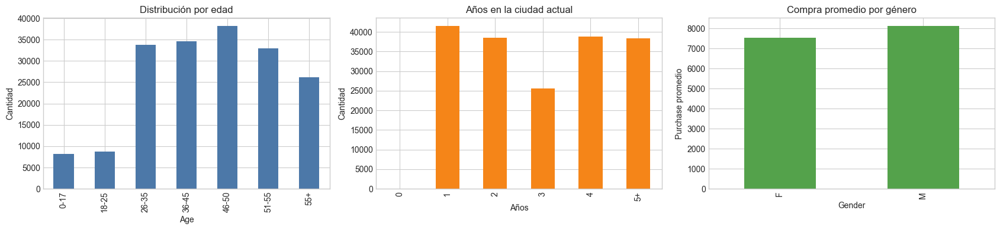

In [579]:
fig, axes = plt.subplots(1, 3, figsize=(17, 4))

orden_age = ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+']
orden_stay = ['0', '1', '2', '3', '4', '5+']

df['Age'].value_counts().reindex(orden_age).plot(kind='bar', ax=axes[0], color='#4C78A8')
axes[0].set(title='Distribución por edad', xlabel='Age', ylabel='Cantidad')

df['Stay_In_Current_City_Years'].value_counts().reindex(orden_stay).plot(kind='bar', ax=axes[1], color='#F58518')
axes[1].set(title='Años en la ciudad actual', xlabel='Años', ylabel='Cantidad')

df.groupby('Gender')['Purchase'].mean().plot(kind='bar', ax=axes[2], color='#54A24B')
axes[2].set(title='Compra promedio por género', xlabel='Gender', ylabel='Purchase promedio')

plt.tight_layout()

### Tratamientos de Nulos y Encoding

In [580]:
# Nulos: 0 significa 'sin segunda subcategoría'
nulos_subcategory_2 = df['Product_Subcategory_2'].isna().sum()
df['Product_Subcategory_2'] = df['Product_Subcategory_2'].fillna(0).astype('int64')

# Encoding ordinal de Age
age_encoder = {
    '0-17': 0, '18-25': 1, '26-35': 2, '36-45': 3,
    '46-50': 4, '51-55': 5, '55+': 6
}
df['Age_Encoded'] = df['Age'].map(age_encoder)

# Encoding de permanencia: 5+ se representa como 5
df['Stay_In_Current_City_Years_Encoded'] = (
    df['Stay_In_Current_City_Years'].replace('5+', '5').astype('int64')
)

print(f'Nulos tratados en Product_Subcategory_2: {nulos_subcategory_2:,} ({nulos_subcategory_2 / len(df):.2%})')
display(df[['Age', 'Age_Encoded', 'Stay_In_Current_City_Years',
            'Stay_In_Current_City_Years_Encoded', 'Product_Subcategory_2']].head())

Nulos tratados en Product_Subcategory_2: 105,260 (57.61%)


,Age,Age_Encoded,Stay_In_Current_City_Years,Stay_In_Current_City_Years_Encoded,Product_Subcategory_2
0,46-50,4,1,1,0
1,36-45,3,3,3,0
2,36-45,3,5+,5,0
3,36-45,3,1,1,8
4,46-50,4,5+,5,0


#### Tratamiento de Outliners

Q1: 578.00
Q3: 11,930.00
IQR: 11,352.00
Límite inferior: -16,450.00
Límite superior: 28,958.00
Outliers detectados: 1,808 (0.99%)
Valores recortados: 1,808


,User_ID,Product_ID,Product_Category,Purchase
144,1025718,P00052838,3,29870
164,1049141,P00008604,13,29390
780,1065401,P00008604,13,29390
806,1065755,P00052838,3,29870
823,1066966,P00082828,20,29630


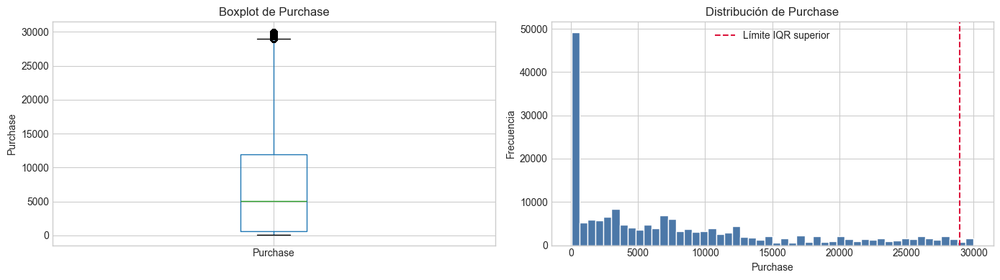

In [581]:
q1 = df['Purchase'].quantile(0.25)
q3 = df['Purchase'].quantile(0.75)
iqr = q3 - q1
limite_inferior = q1 - 1.5 * iqr
limite_superior = q3 + 1.5 * iqr

df['Purchase_Is_Outlier'] = (
    (df['Purchase'] < limite_inferior) | (df['Purchase'] > limite_superior)
)
outliers = df.loc[df['Purchase_Is_Outlier']]

print(f'Q1: {q1:,.2f}')
print(f'Q3: {q3:,.2f}')
print(f'IQR: {iqr:,.2f}')
print(f'Límite inferior: {limite_inferior:,.2f}')
print(f'Límite superior: {limite_superior:,.2f}')
print(f'Outliers detectados: {len(outliers):,} ({len(outliers) / len(df):.2%})')

# Winsorización: se conserva Purchase original y se limita una copia.
df['Purchase_Clipped'] = df['Purchase'].clip(
    lower=limite_inferior, upper=limite_superior
)
valores_recortados = (df['Purchase'] != df['Purchase_Clipped']).sum()
print(f'Valores recortados: {valores_recortados:,}')

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
df.boxplot(column='Purchase', ax=axes[0])
axes[0].set(title='Boxplot de Purchase', ylabel='Purchase')
axes[1].hist(df['Purchase'], bins=50, color='#4C78A8', edgecolor='white')
axes[1].axvline(limite_superior, color='crimson', linestyle='--', label='Límite IQR superior')
axes[1].set(title='Distribución de Purchase', xlabel='Purchase', ylabel='Frecuencia')
axes[1].legend()
plt.tight_layout()

display(outliers[['User_ID', 'Product_ID', 'Product_Category', 'Purchase']].head())

## Asociación entre Variable Categoricas

In [582]:
def cramers_v(serie_a, serie_b):
    """Calcula V de Cramér a partir de una tabla de contingencia."""
    tabla = pd.crosstab(serie_a, serie_b)
    observados = tabla.to_numpy()
    total = observados.sum()
    esperados = np.outer(observados.sum(axis=1), observados.sum(axis=0)) / total
    chi2 = ((observados - esperados) ** 2 / esperados).sum()
    minimo_grados_libertad = min(observados.shape) - 1
    return 0.0 if minimo_grados_libertad == 0 else np.sqrt(chi2 / (total * minimo_grados_libertad))

def mostrar_tabla_y_asociacion(dataframe, variable_a, variable_b):
    tabla = pd.crosstab(dataframe[variable_a], dataframe[variable_b])
    tabla_porcentaje = pd.crosstab(
        dataframe[variable_a], dataframe[variable_b], normalize='index'
    ).mul(100).round(1)
    v_cramer = cramers_v(dataframe[variable_a], dataframe[variable_b])
    print(f'V de Cramér ({variable_a} vs {variable_b}): {v_cramer:.3f}')
    print('Porcentajes por fila:')
    display(tabla_porcentaje)
    return tabla, v_cramer

### City_Category y Stay_In_Current_City_Years

V de Cramér (City_Category vs Stay_In_Current_City_Years): 0.035
Porcentajes por fila:


Stay_In_Current_City_Years,1,2,3,4,5+
City_Category,,,,,
A,22.1,20.6,15.2,21.6,20.5
B,23.5,19.9,13.9,20.5,22.2
C,22.6,23.2,12.3,21.6,20.2


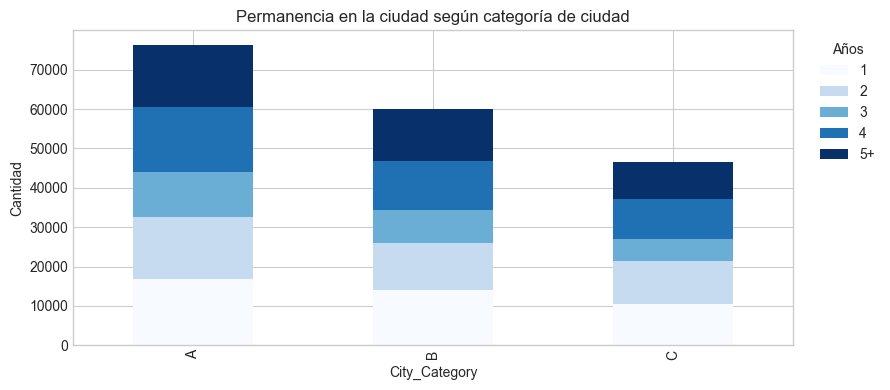

In [583]:
tabla_ciudad_estadia, v_ciudad_estadia = mostrar_tabla_y_asociacion(
    df, 'City_Category', 'Stay_In_Current_City_Years'
)

ax = tabla_ciudad_estadia.plot(kind='bar', stacked=True, figsize=(9, 4), colormap='Blues')
ax.set(title='Permanencia en la ciudad según categoría de ciudad',
       xlabel='City_Category', ylabel='Cantidad')
ax.legend(title='Años', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()

### Product_Category, Product_Subcategory_1 y Product_Subcategory_2

`Product_Subcategory_2` usa el valor `0` para la categoría sin segunda subcategoría, según el tratamiento de nulos aplicado antes.

,Product_Category,Product_Subcategory_1,Product_Subcategory_2
Product_Category,1.000,0.234,0.099
Product_Subcategory_1,0.234,1.000,0.159
Product_Subcategory_2,0.099,0.159,1.000



Product_Category vs Product_Subcategory_1
V de Cramér (Product_Category vs Product_Subcategory_1): 0.234
Porcentajes por fila:


Product_Subcategory_1,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,18.0,20.0,21.0,22.0,24.0,25.0,26.0,27.0,28.0,30.0,32.0,33.0,35.0,36.0,39.0,40.0,42.0,44.0,45.0
Product_Category,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,8.1,0.0,5.2,0.0,0.0,0.0,0.0,5.9,0.0,0.0,0.0,11.9,11.3,0.0,0.0,0.0,0.0,7.9,8.3,10.9,0.0,0.0,2.9,5.2,0.0,8.3,8.5,0.0,5.7
2,5.3,0.0,5.1,4.8,0.0,0.0,2.8,5.5,0.0,7.1,0.0,0.0,4.2,0.0,7.3,3.0,7.5,0.0,7.6,2.6,0.0,7.6,0.0,11.8,0.0,2.9,2.3,7.4,0.0,0.0,0.0,0.0,5.3
3,0.5,0.0,1.0,1.1,3.9,0.0,2.0,4.1,2.3,3.5,3.5,5.5,2.6,0.0,3.4,6.3,2.5,3.4,4.3,0.9,4.5,1.8,5.4,4.3,0.0,0.5,5.5,6.2,1.9,5.4,4.2,6.7,2.6
4,0.0,7.7,0.0,6.4,0.0,4.2,0.0,0.0,0.0,7.4,0.0,0.0,0.0,8.2,5.7,9.0,0.0,0.0,5.4,0.0,0.0,0.0,8.0,7.7,7.1,0.0,0.0,2.2,0.0,9.9,5.0,6.2,0.0
5,0.0,8.4,0.0,10.3,0.0,2.1,0.0,0.0,0.0,4.8,0.0,0.0,0.0,5.8,6.3,5.6,0.0,0.0,7.8,0.0,0.0,0.0,5.1,5.5,7.7,0.0,0.0,6.8,0.0,8.3,5.4,10.0,0.0
6,0.0,0.0,0.0,0.0,8.5,0.0,7.9,9.8,0.0,0.0,0.0,4.8,0.0,0.0,5.5,2.0,8.7,0.0,0.0,0.0,0.0,7.9,9.8,2.3,0.0,0.0,4.5,8.6,0.0,3.2,8.4,0.0,8.2
7,0.0,0.0,0.0,0.0,2.9,0.0,3.3,7.1,0.0,0.0,0.0,4.3,0.0,0.0,5.2,11.1,1.8,0.0,0.0,0.0,0.0,9.7,11.5,2.2,0.0,0.0,8.5,9.9,0.0,8.4,7.5,0.0,6.6
8,3.6,0.0,2.5,4.3,2.2,0.0,7.5,13.2,0.0,0.0,0.0,2.2,3.6,0.0,13.0,0.0,2.1,0.0,0.0,5.0,0.0,5.0,0.0,8.8,0.0,1.9,6.4,7.1,1.1,5.6,5.0,0.0,0.0
9,0.0,0.0,0.0,0.0,9.1,0.0,5.6,6.6,0.0,0.0,0.0,5.2,0.0,0.0,5.8,7.9,7.3,0.0,0.0,0.0,0.0,10.3,5.6,9.7,0.0,0.0,7.2,4.5,0.0,4.3,7.5,0.0,3.4



Product_Category vs Product_Subcategory_2
V de Cramér (Product_Category vs Product_Subcategory_2): 0.099
Porcentajes por fila:


Product_Subcategory_2,0,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
Product_Category,,,,,,,,,,,,,,,,,
1,64.7,0.0,0.0,0.0,2.0,0.0,4.3,2.1,4.3,0.0,4.6,0.0,4.5,4.5,0.0,7.0,2.1
2,51.0,2.1,8.7,1.7,2.0,1.8,6.0,0.0,4.3,4.1,0.0,1.9,4.7,3.4,6.3,2.1,0.0
3,58.7,0.7,1.1,3.8,3.0,3.5,2.9,2.6,1.3,0.8,3.3,4.7,2.2,1.0,4.9,2.1,3.3
4,57.4,0.6,1.1,3.1,1.7,3.1,4.8,1.3,4.2,0.7,2.7,5.3,4.3,3.1,2.8,1.2,2.6
5,58.3,2.2,3.6,1.0,2.0,2.2,2.3,6.4,2.1,1.6,1.7,1.4,1.5,5.1,1.8,4.1,2.7
6,59.9,3.9,1.6,1.1,1.0,2.5,4.5,1.6,2.8,1.8,4.7,2.6,1.9,2.5,3.2,2.7,1.8
7,62.4,1.6,1.8,2.9,4.9,1.7,0.0,1.7,6.0,2.6,0.7,0.8,1.8,3.1,2.9,1.5,3.6
8,50.8,5.5,1.4,1.8,8.7,0.0,3.1,3.5,3.1,0.7,3.8,5.8,1.0,0.8,2.7,5.6,1.6
9,58.6,0.8,3.5,3.4,2.2,2.3,2.8,1.4,0.6,2.2,4.8,0.7,2.8,1.5,4.7,3.9,4.0



Product_Subcategory_1 vs Product_Subcategory_2
V de Cramér (Product_Subcategory_1 vs Product_Subcategory_2): 0.159
Porcentajes por fila:


Product_Subcategory_2,0,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
Product_Subcategory_1,,,,,,,,,,,,,,,,,
3.0,54.4,0.0,0.0,6.1,0.0,0.0,7.0,0.0,6.8,0.0,0.0,0.0,0.0,0.0,6.7,13.3,5.7
4.0,51.9,5.3,0.0,0.0,1.5,1.5,3.5,6.7,1.5,2.5,0.0,2.7,4.8,9.4,0.0,2.6,6.0
5.0,28.8,7.7,0.0,14.9,0.0,8.6,8.9,0.0,0.0,14.4,0.0,0.0,7.1,0.0,9.7,0.0,0.0
6.0,62.6,1.9,4.5,1.3,2.3,1.1,2.2,3.5,1.0,1.7,1.3,3.5,2.4,0.0,4.4,3.7,2.4
7.0,68.2,0.9,3.9,5.4,0.0,3.3,0.0,2.2,0.8,0.0,0.8,0.0,1.7,2.5,0.7,3.0,6.5
8.0,64.6,0.0,0.0,4.8,4.4,6.9,1.7,5.1,0.0,0.0,0.0,2.7,2.2,0.0,2.1,0.0,5.4
9.0,43.5,5.5,6.3,5.6,4.2,1.8,4.2,2.1,2.8,0.0,0.0,9.0,2.9,0.0,6.7,4.1,1.3
10.0,58.3,0.8,2.9,1.8,8.1,0.0,2.8,1.2,8.6,0.0,2.4,4.3,0.9,1.5,1.4,0.0,5.1
11.0,23.5,21.9,0.0,32.8,0.0,0.0,11.2,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0


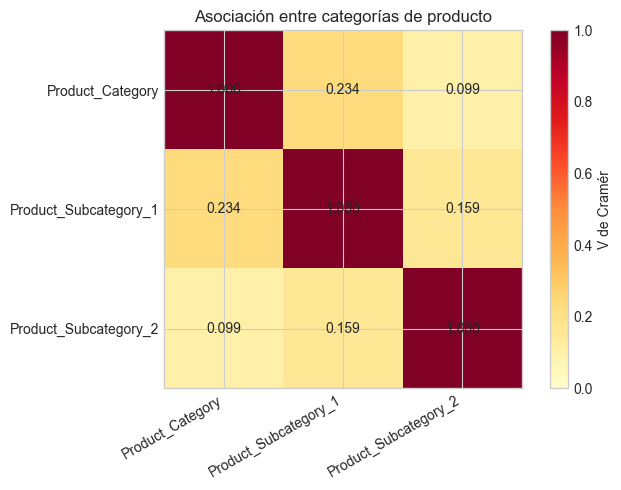

In [584]:
variables_producto = [
    'Product_Category', 'Product_Subcategory_1', 'Product_Subcategory_2'
]
asociaciones_producto = pd.DataFrame(
    np.eye(len(variables_producto)),
    index=variables_producto, columns=variables_producto
)

for indice, variable_a in enumerate(variables_producto):
    for variable_b in variables_producto[indice + 1:]:
        valor = cramers_v(df[variable_a], df[variable_b])
        asociaciones_producto.loc[variable_a, variable_b] = valor
        asociaciones_producto.loc[variable_b, variable_a] = valor

display(asociaciones_producto.round(3))

fig, ax = plt.subplots(figsize=(7, 5))
imagen = ax.imshow(asociaciones_producto, vmin=0, vmax=1, cmap='YlOrRd')
ax.set_xticks(range(len(variables_producto)), variables_producto, rotation=30, ha='right')
ax.set_yticks(range(len(variables_producto)), variables_producto)
for fila in range(len(variables_producto)):
    for columna in range(len(variables_producto)):
        ax.text(columna, fila, f'{asociaciones_producto.iloc[fila, columna]:.3f}',
                ha='center', va='center')
fig.colorbar(imagen, ax=ax, label='V de Cramér')
ax.set_title('Asociación entre categorías de producto')
plt.tight_layout()

for variable_a, variable_b in [
    ('Product_Category', 'Product_Subcategory_1'),
    ('Product_Category', 'Product_Subcategory_2'),
    ('Product_Subcategory_1', 'Product_Subcategory_2'),
]:
    print(f'\n{variable_a} vs {variable_b}')
    mostrar_tabla_y_asociacion(df, variable_a, variable_b)

La mayor asociación es entre Product_Category y Product_Subcategory_1, aunque sigue siendo baja. Entre ciudad y años de permanencia prácticamente no hay asociación. Por lo tanto no podes determinar la eliminación de alguna de los atributos. Dicho esto vamos a usarlos en su totalidad para el training del modelo y su posterior testeo y vamos a medir el {R2} para medir eficiencia.

### Tabla para modelado por cliente

Cada fila representa un cliente. `Gasto_Promedio` es el objetivo a modelar y se calcula desde `Purchase_Clipped` para que los valores extremos no dominen el promedio. `User_ID` se conserva únicamente como identificador: debe excluirse de las variables de entrada de la red.

In [585]:
# Verificación: las variables demográficas deben ser constantes por cliente.
atributos_fijos = ['Age_Encoded', 'Gender', 'Marital_Status', 'City_Category']
variacion_por_cliente = df.groupby('User_ID')[atributos_fijos].nunique()
assert (variacion_por_cliente <= 1).all().all(), (
    'Hay clientes con atributos demográficos inconsistentes.'
)

# Gender es binario; Marital_Status ya está codificada como 0/1.
gender_encoder = {'F': 0, 'M': 1}
df['Gender_Encoded'] = df['Gender'].map(gender_encoder).astype('int8')
df['Marital_Status_Encoded'] = df['Marital_Status'].astype('int8')

# City_Category no tiene orden natural: se codifica con one-hot encoding.
ciudad_encoded = pd.get_dummies(
    df[['User_ID', 'City_Category']], columns=['City_Category'], dtype='int8'
).groupby('User_ID').max()

tabla_clientes = (
    df.groupby('User_ID')
    .agg(
        Age_Encoded=('Age_Encoded', 'first'),
        Gender_Encoded=('Gender_Encoded', 'first'),
        Marital_Status_Encoded=('Marital_Status_Encoded', 'first'),
        Stay_In_Current_City_Years_Encoded=(
            'Stay_In_Current_City_Years_Encoded', 'first'
        ),
        Cantidad_Compras=('Purchase', 'size'),
        Gasto_Promedio=('Purchase_Clipped', 'mean'),
    )
    .join(ciudad_encoded)
    .reset_index()
)

# Proporciones de categorías por cliente. Usan únicamente compras históricas: son
# datos disponibles al predecir para un cliente nuevo con 3 a 5 visitas. No usan
# Purchase ni Gasto_Promedio, para evitar leakage.
for columna in ['Product_Category', 'Product_Subcategory_1', 'Product_Subcategory_2']:
    proporciones = (
        pd.crosstab(df['User_ID'], df[columna], normalize='index')
        .add_prefix(f'{columna}_prop_')
        .reset_index()
    )
    tabla_clientes = tabla_clientes.merge(proporciones, on='User_ID', how='left')

tabla_clientes = tabla_clientes.fillna(0)

# Features de comportamiento: describen diversidad y repetición de la canasta.
# Se calculan sin usar importes; por lo tanto no introducen leakage del target.
comportamiento = df.groupby('User_ID').agg(
    Productos_Distintos=('Product_ID', 'nunique'),
    Categorias_Distintas=('Product_Category', 'nunique'),
).reset_index()
tabla_clientes = tabla_clientes.merge(comportamiento, on='User_ID', how='left')
tabla_clientes['Tasa_Recompra'] = 1 - (
    tabla_clientes['Productos_Distintos'] / tabla_clientes['Cantidad_Compras']
)
columnas_prop_categoria = [
    c for c in tabla_clientes.columns if c.startswith('Product_Category_prop_')
]
tabla_clientes['Concentracion_Categorias_HHI'] = (
    tabla_clientes[columnas_prop_categoria] ** 2
).sum(axis=1)

print(f'Clientes: {len(tabla_clientes):,}')
display(tabla_clientes.head())
display(tabla_clientes.describe().T)

Clientes: 7,432


,User_ID,Age_Encoded,Gender_Encoded,Marital_Status_Encoded,Stay_In_Current_City_Years_Encoded,Cantidad_Compras,Gasto_Promedio,City_Category_A,City_Category_B,City_Category_C,Product_Category_prop_1,Product_Category_prop_2,Product_Category_prop_3,Product_Category_prop_4,Product_Category_prop_5,Product_Category_prop_6,Product_Category_prop_7,Product_Category_prop_8,Product_Category_prop_9,Product_Category_prop_10,Product_Category_prop_11,Product_Category_prop_12,Product_Category_prop_13,Product_Category_prop_14,Product_Category_prop_15,Product_Category_prop_16,Product_Category_prop_17,Product_Category_prop_18,Product_Category_prop_19,Product_Category_prop_20,Product_Subcategory_1_prop_3.0,Product_Subcategory_1_prop_4.0,Product_Subcategory_1_prop_5.0,Product_Subcategory_1_prop_6.0,Product_Subcategory_1_prop_7.0,Product_Subcategory_1_prop_8.0,Product_Subcategory_1_prop_9.0,Product_Subcategory_1_prop_10.0,Product_Subcategory_1_prop_11.0,Product_Subcategory_1_prop_12.0,Product_Subcategory_1_prop_13.0,Product_Subcategory_1_prop_14.0,Product_Subcategory_1_prop_15.0,Product_Subcategory_1_prop_16.0,Product_Subcategory_1_prop_18.0,Product_Subcategory_1_prop_20.0,Product_Subcategory_1_prop_21.0,Product_Subcategory_1_prop_22.0,Product_Subcategory_1_prop_24.0,Product_Subcategory_1_prop_25.0,Product_Subcategory_1_prop_26.0,Product_Subcategory_1_prop_27.0,Product_Subcategory_1_prop_28.0,Product_Subcategory_1_prop_30.0,Product_Subcategory_1_prop_32.0,Product_Subcategory_1_prop_33.0,Product_Subcategory_1_prop_35.0,Product_Subcategory_1_prop_36.0,Product_Subcategory_1_prop_39.0,Product_Subcategory_1_prop_40.0,Product_Subcategory_1_prop_42.0,Product_Subcategory_1_prop_44.0,Product_Subcategory_1_prop_45.0,Product_Subcategory_2_prop_0,Product_Subcategory_2_prop_5,Product_Subcategory_2_prop_6,Product_Subcategory_2_prop_7,Product_Subcategory_2_prop_8,Product_Subcategory_2_prop_9,Product_Subcategory_2_prop_10,Product_Subcategory_2_prop_11,Product_Subcategory_2_prop_12,Product_Subcategory_2_prop_13,Product_Subcategory_2_prop_14,Product_Subcategory_2_prop_15,Product_Subcategory_2_prop_16,Product_Subcategory_2_prop_17,Product_Subcategory_2_prop_18,Product_Subcategory_2_prop_19,Product_Subcategory_2_prop_20,Productos_Distintos,Categorias_Distintas,Tasa_Recompra,Concentracion_Categorias_HHI
0,1000035,1,1,0,1,13,1912.923077,1,0,0,0.000000,0.00000,0.000000,0.000000,0.153846,0.000000,0.076923,0.000000,0.076923,0.230769,0.000000,0.000000,0.000000,0.000000,0.076923,0.384615,0.000000,0.000000,0.000000,0.000000,0.0,0.181818,0.0,0.000000,0.000000,0.090909,0.000000,0.000000,0.0,0.000000,0.000000,0.090909,0.000000,0.090909,0.000000,0.181818,0.000000,0.00,0.000000,0.0,0.00,0.000000,0.000000,0.000000,0.0,0.090909,0.090909,0.090909,0.000000,0.090909,0.000000,0.000000,0.000000,0.384615,0.000000,0.000000,0.076923,0.153846,0.000000,0.000000,0.076923,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.153846,0.153846,13,6,0.00000,0.242604
1,1000044,3,1,1,4,43,14326.534884,1,0,0,0.023256,0.00000,0.116279,0.023256,0.000000,0.000000,0.116279,0.069767,0.069767,0.000000,0.023256,0.023256,0.093023,0.000000,0.023256,0.046512,0.046512,0.139535,0.069767,0.116279,0.0,0.000000,0.0,0.000000,0.076923,0.000000,0.000000,0.115385,0.0,0.000000,0.038462,0.000000,0.000000,0.000000,0.038462,0.038462,0.038462,0.00,0.038462,0.0,0.00,0.038462,0.115385,0.038462,0.0,0.038462,0.038462,0.038462,0.115385,0.000000,0.115385,0.076923,0.000000,0.651163,0.023256,0.023256,0.023256,0.069767,0.000000,0.023256,0.046512,0.023256,0.000000,0.0,0.00000,0.046512,0.023256,0.046512,0.000000,0.000000,43,15,0.00000,0.090319
2,1000070,4,1,1,4,42,4120.809524,0,1,0,0.047619,0.02381,0.023810,0.023810,0.023810,0.023810,0.119048,0.047619,0.071429,0.047619,0.071429,0.047619,0.000000,0.095238,0.071429,0.142857,0.119048,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.035714,0.035714,0.035714,0.071429,0.107143,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.071429,0.107143,0.00,0.035714,0.0,0.00,0.035714,0.0357

,count,mean,std,min,25%,50%,75%,max
User_ID,7432.0,1.049772e+06,28832.028398,1.000035e+06,1.024772e+06,1.049775e+06,1.074651e+06,1.099995e+06
Age_Encoded,7432.0,3.368541e+00,1.757218,0.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00,6.000000e+00
Gender_Encoded,7432.0,5.248924e-01,0.499414,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
Marital_Status_Encoded,7432.0,5.933800e-01,0.491236,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
Stay_In_Current_City_Years_Encoded,7432.0,2.626211e+00,1.425757,1.000000e+00,1.000000e+00,2.000000e+00,4.000000e+00,5.000000e+00
...,...,...,...,...,...,...,...,...
Product_Subcategory_2_prop_20,7432.0,3.094452e-02,0.040987,0.000000e+00,0.000000e+00,0.000000e+00,5.555556e-02,4.000000e-01
Productos_Distintos,7432.0,2.428310e+01,13.359699,9.000000e+00,1.400000e+01,1.800000e+01,3.900000e+01,5.000000e+01
Categorias_Distintas,7432.0,1.168326e+01,3.602254,4.000000e+00,9.000000e+00,1.100000e+01,1.500000e+01,2.000000e+01
Tasa_Recompra,7432.0,8.623916e-03,0.018682,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.333333e-01


#### Exportación de Datos

In [586]:
# Verificar que no se introdujeron valores faltantes en las columnas transformadas
columnas_transformadas = [
    'Product_Subcategory_2', 'Age_Encoded', 'Stay_In_Current_City_Years_Encoded',
    'Purchase_Clipped'
]
assert df[columnas_transformadas].isna().sum().sum() == 0
assert df['Purchase_Clipped'].between(limite_inferior, limite_superior).all()

df.to_csv('dataset_compras_procesado.csv', index=False)
tabla_clientes.to_csv('tabla_clientes_modelado.csv', index=False)
print('Archivo creado: dataset_compras_procesado.csv')
print('Archivo creado: tabla_clientes_modelado.csv')
display(df.head())

Archivo creado: dataset_compras_procesado.csv
Archivo creado: tabla_clientes_modelado.csv


,User_ID,Product_ID,Age,Gender,Marital_Status,City_Category,Stay_In_Current_City_Years,Product_Category,Product_Subcategory_1,Product_Subcategory_2,Purchase,Age_Encoded,Stay_In_Current_City_Years_Encoded,Purchase_Is_Outlier,Purchase_Clipped,Gender_Encoded,Marital_Status_Encoded
0,1044096,P00017122,46-50,F,1,B,1,10,45.0,0,1810,4,1,False,1810,0,1
1,1071818,P00074517,36-45,M,0,A,3,11,27.0,0,12351,3,3,False,12351,1,0
2,1022986,P00013694,36-45,M,1,A,5+,4,28.0,0,127,3,5,False,127,1,1
3,1094684,P00049122,36-45,M,1,A,1,16,9.0,8,2214,3,1,False,2214,1,1
4,1004157,P00006469,46-50,M,1,A,5+,3,NaN,0,7142,4,5,False,7142,1,1


### Modelado

#### Primero vamos a crear los data set de train y test con los solicitado (una vez que el modelo ya esté listo y entrenado, se use para estimar apartir de datos de clientes relativamente nuevos, que solo llevan entre 3 a 5 visitas y compras en la tienda)

In [587]:
from sklearn.model_selection import train_test_split
import torch

# Clientes relativamente nuevos: entre 3 y 5 compras
ds_eval = tabla_clientes[
    tabla_clientes["Cantidad_Compras"].between(3, 5)
].copy()

# Clientes con más historial para entrenar
df = tabla_clientes[
    tabla_clientes["Cantidad_Compras"] > 5
].copy()

# Cantidad_Compras solo define el historial disponible; no entra a la red para
# evitar que el modelo dependa del volumen acumulado de transacciones.
X = df.drop(columns=['Gasto_Promedio', 'User_ID', 'Cantidad_Compras'])
y = df['Gasto_Promedio']

# Partición por cliente: 70% train, 15% validation y 15% test.
# Test queda reservado para la evaluación final: no participa en decisiones.
X_train, X_temporal, y_train, y_temporal = train_test_split(
    X, y, test_size=0.30, random_state=42
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temporal, y_temporal, test_size=0.50, random_state=42
)

# Todas las columnas predictoras, incluidas las proporciones de categorías.
features = X.columns.tolist()
print(f'Cantidad de features: {len(features)}')

# Convertir a tensores de PyTorch
tensor_Xt = torch.tensor(X_train[features].to_numpy(), dtype=torch.float32)
tensor_yt = torch.tensor(y_train.to_numpy(), dtype=torch.float32).unsqueeze(1) # Reshape to [N, 1]

# Estos tensores se usan durante el entrenamiento como validation.
tensor_Xtst = torch.tensor(X_val[features].to_numpy(), dtype=torch.float32)
tensor_ytst = torch.tensor(y_val.to_numpy(), dtype=torch.float32).unsqueeze(1)

# Test se reserva hasta que el modelo y la época final ya fueron elegidos.
tensor_Xtest = torch.tensor(X_test[features].to_numpy(), dtype=torch.float32)
tensor_ytest = torch.tensor(y_test.to_numpy(), dtype=torch.float32).unsqueeze(1)


print(f"Train: {len(X_train):,} | Validation: {len(X_val):,} | Test: {len(X_test):,} clientes")
print(f"X train: {tensor_Xt.shape} | X validation: {tensor_Xtst.shape} | X test: {tensor_Xtest.shape}")

Cantidad de features: 81
Train: 5,202 | Validation: 1,115 | Test: 1,115 clientes
X train: torch.Size([5202, 81]) | X validation: torch.Size([1115, 81]) | X test: torch.Size([1115, 81])


In [588]:
from sklearn.preprocessing import StandardScaler

# Inicializar el StandardScaler para las características X
scaler_X = StandardScaler()

# Ajustar el scaler solo con los datos de entrenamiento y transformar
tensor_Xt_scaled = scaler_X.fit_transform(tensor_Xt)
tensor_Xtst_scaled = scaler_X.transform(tensor_Xtst)
tensor_Xtest_scaled = scaler_X.transform(tensor_Xtest)

# Inicializar el StandardScaler para la variable objetivo Y
scaler_y = StandardScaler()

# Ajustar el scaler solo con los datos de entrenamiento y transformar
tensor_yt_scaled = scaler_y.fit_transform(tensor_yt)
tensor_ytst_scaled = scaler_y.transform(tensor_ytst)
tensor_ytest_scaled = scaler_y.transform(tensor_ytest)

# Convertir de nuevo a tensores de PyTorch
tensor_Xt = torch.tensor(tensor_Xt_scaled, dtype=torch.float32)
tensor_Xtst = torch.tensor(tensor_Xtst_scaled, dtype=torch.float32)
tensor_Xtest = torch.tensor(tensor_Xtest_scaled, dtype=torch.float32)
tensor_yt = torch.tensor(tensor_yt_scaled, dtype=torch.float32)
tensor_ytst = torch.tensor(tensor_ytst_scaled, dtype=torch.float32)
tensor_ytest = torch.tensor(tensor_ytest_scaled, dtype=torch.float32)

print("Datos de entrada y objetivo normalizados con estadísticos de train.")
print(f"Tensor Xtrain (escalado): {tensor_Xt.shape}")
print(f"Tensor ytrain (escalado): {tensor_yt.shape}")
print(f"Tensor Xvalidation (escalado): {tensor_Xtst.shape}")
print(f"Tensor Xtest (escalado): {tensor_Xtest.shape}")

Datos de entrada y objetivo normalizados con estadísticos de train.
Tensor Xtrain (escalado): torch.Size([5202, 81])
Tensor ytrain (escalado): torch.Size([5202, 1])
Tensor Xvalidation (escalado): torch.Size([1115, 81])
Tensor Xtest (escalado): torch.Size([1115, 81])


### Revisión del Escalado de Datos

Aquí puedes ver las estadísticas de los escaladores y de los datos de entrenamiento y prueba, tanto antes como después de ser escalados, para verificar la consistencia.

In [589]:
print('--- Estadísticas del StandardScaler para las características (X) ---')
print(f'Media de scaler_X: {scaler_X.mean_}')
print(f'Desviación estándar de scaler_X: {scaler_X.scale_}')

print('\n--- Estadísticas del StandardScaler para la variable objetivo (y) ---')
print(f'Media de scaler_y: {scaler_y.mean_}')
print(f'Desviación estándar de scaler_y: {scaler_y.scale_}')

print('\n--- Estadísticas de los datos de entrenamiento (escalados) ---')
print(f'Media de tensor_Xt (escalado): {torch.mean(tensor_Xt, dim=0)}')
print(f'Desviación estándar de tensor_Xt (escalado): {torch.std(tensor_Xt, dim=0)}')
print(f'Media de tensor_yt (escalado): {torch.mean(tensor_yt, dim=0)}')
print(f'Desviación estándar de tensor_yt (escalado): {torch.std(tensor_yt, dim=0)}')

print('\n--- Estadísticas de los datos de prueba (escalados) ---')
print(f'Media de tensor_Xtst (escalado): {torch.mean(tensor_Xtst, dim=0)}')
print(f'Desviación estándar de tensor_Xtst (escalado): {torch.std(tensor_Xtst, dim=0)}')
print(f'Media de tensor_ytst (escalado): {torch.mean(tensor_ytst, dim=0)}')
print(f'Desviación estándar de tensor_ytst (escalado): {torch.std(tensor_ytst, dim=0)}')

print('\n--- Estadísticas de los datos originales (antes de escalar) ---')
print(f'Media de X_train (original): {X_train[features].mean().to_numpy()}')
print(f'Desviación estándar de X_train (original): {X_train[features].std().to_numpy()}')
print(f'Media de y_train (original): {y_train.mean()}')
print(f'Desviación estándar de y_train (original): {y_train.std()}')

print('\nMedia de X_test (original): {X_test[features].mean().to_numpy()}')
print(f'Desviación estándar de X_test (original): {X_test[features].std().to_numpy()}')
print(f'Media de y_test (original): {y_test.mean()}')
print(f'Desviación estándar de y_test (original): {y_test.std()}')

--- Estadísticas del StandardScaler para las características (X) ---
Media de scaler_X: [3.37254902e+00 5.24413687e-01 5.91695502e-01 2.63725490e+00
 3.86774318e-01 3.36793541e-01 2.76432141e-01 3.30526606e-02
 1.92899832e-02 9.32615875e-02 5.59240780e-02 6.27749549e-02
 3.17067345e-02 3.16805334e-02 4.43050143e-02 4.00051926e-02
 8.70755033e-02 5.97097274e-02 6.40256735e-02 3.31076967e-02
 3.17877329e-02 4.63770860e-02 7.37476930e-02 8.56659935e-02
 3.38833057e-02 3.33826264e-02 3.92362388e-02 7.75011161e-03
 2.88771377e-02 5.97450208e-03 3.03037080e-02 3.90448185e-02
 1.75865357e-02 3.04061947e-02 3.94035458e-02 8.97598286e-03
 3.19553513e-02 1.18999264e-02 3.16777467e-02 7.11393993e-03
 2.46133315e-02 4.98319213e-02 6.18623655e-02 3.67871287e-02
 9.19276593e-03 3.30732796e-02 7.22357385e-03 8.98255259e-03
 3.65142290e-02 4.73484310e-02 5.75505622e-02 1.96582239e-02
 9.82348585e-03 3.27231089e-02 6.45188833e-02 1.18672507e-02
 6.91161486e-02 6.56219669e-02 3.64557265e-02 2.62655826e-

### 2B) Ejecutamos ahora el modelo Multilayer Perceptron

In [590]:
import torch
import torch.nn as nn

# 1. Definimos los datos de entrada (X) y el objetivo real (Y)
# Usamos torch.tensor y le ponemos float para que maneje decimales
#X = torch.tensor([[1.8], [-3.4]], dtype=torch.float32).T  # Transpuesto para que sea (1, 2) -> 1 muestra, 2 variables
#Y_real = torch.tensor([[5.0]], dtype=torch.float32)       # El objetivo que queremos predecir

# 2. Diseñamos la arquitectura de la Red Neuronal
class MiRedNeuronal(nn.Module):
    def __init__(self, n_entradas, clase_activacion=nn.ReLU):
        super(MiRedNeuronal, self).__init__()
        # Cuatro capas ocultas: todas cumplen el mínimo de 32 neuronas.
        self.capa1 = nn.Linear(in_features=n_entradas, out_features=128)
        self.capa2 = nn.Linear(in_features=128, out_features=64)
        self.capa3 = nn.Linear(in_features=64, out_features=32)
        self.capa4 = nn.Linear(in_features=32, out_features=32)
        self.capa5 = nn.Linear(in_features=32, out_features=1)

        self.activacion = clase_activacion()
        self.dropout = nn.Dropout(p=0.10)

    def red(self, x):
        # Pase hacia adelante (Forward Pass)
        x = self.dropout(self.activacion(self.capa1(x)))
        x = self.dropout(self.activacion(self.capa2(x)))
        x = self.dropout(self.activacion(self.capa3(x)))
        x = self.dropout(self.activacion(self.capa4(x)))

        return self.capa5(x)

    def forward(self, x):
        # Pase hacia adelante (Forward Pass)

        return self.red(x)

# Semilla fija: permite atribuir cambios de métricas al experimento y no al azar.
SEED = 42
torch.manual_seed(SEED)



### Comparación de funciones de activación

Se mantienen constantes las features, la arquitectura, la regularización, la partición y la semilla (`42`). La celda siguiente ejecuta una red nueva para cada activación y construye esta tabla automáticamente. La selección se realiza exclusivamente con el mejor R² de validation; el conjunto de test no participa.

### Entrenamiento reutilizable y experimento de activaciones

In [591]:
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import pandas as pd

import copy
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Una única función para entrenar cualquier activación bajo las mismas condiciones.
def entrenar_mlp(clase_activacion, learning_rate=1e-3, num_epochs=300, paciencia=30):
    torch.manual_seed(SEED)
    modelo_local = MiRedNeuronal(
        n_entradas=len(features), clase_activacion=clase_activacion
    ).to(device)
    optimizador_local = torch.optim.Adam(
        modelo_local.parameters(), lr=learning_rate, weight_decay=1e-4
    )
    criterio_local = nn.MSELoss()
    generador = torch.Generator().manual_seed(SEED)
    dataloader = DataLoader(
        TensorDataset(tensor_Xt, tensor_yt), batch_size=32,
        shuffle=True, generator=generador
    )

    historial = {'loss_train': [], 'loss_val': [], 'r2_train': [], 'r2_val': []}
    mejor_r2_val, mejor_r2_train, mejor_epoca = float('-inf'), None, 0
    mejor_estado, epocas_sin_mejora = None, 0

    for epoca in range(1, num_epochs + 1):
        modelo_local.train()
        for batch_X, batch_y in dataloader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            optimizador_local.zero_grad()
            loss = criterio_local(modelo_local(batch_X), batch_y)
            loss.backward()
            optimizador_local.step()

        modelo_local.eval()
        with torch.no_grad():
            pred_train = modelo_local(tensor_Xt.to(device))
            pred_val = modelo_local(tensor_Xtst.to(device))
            loss_train = criterio_local(pred_train, tensor_yt.to(device)).item()
            loss_val = criterio_local(pred_val, tensor_ytst.to(device)).item()

        r2_train = r2_score(tensor_yt.cpu().numpy(), pred_train.cpu().numpy())
        r2_val = r2_score(tensor_ytst.cpu().numpy(), pred_val.cpu().numpy())
        historial['loss_train'].append(loss_train)
        historial['loss_val'].append(loss_val)
        historial['r2_train'].append(r2_train)
        historial['r2_val'].append(r2_val)

        if r2_val > mejor_r2_val:
            mejor_r2_val, mejor_r2_train, mejor_epoca = r2_val, r2_train, epoca
            mejor_estado = copy.deepcopy(modelo_local.state_dict())
            epocas_sin_mejora = 0
        else:
            epocas_sin_mejora += 1
            if epocas_sin_mejora >= paciencia:
                break

    modelo_local.load_state_dict(mejor_estado)
    return {
        'Activación': clase_activacion.__name__, 'R² train': mejor_r2_train,
        'Mejor R² validation': mejor_r2_val, 'Mejor época': mejor_epoca,
        'modelo': modelo_local, 'historial': historial,
        'clase_activacion': clase_activacion
    }

# Solo cambia la activación: el resto de los hiperparámetros permanece fijo.
resultados_activacion = [
    entrenar_mlp(nn.ReLU),
    entrenar_mlp(nn.ELU)
]

tabla_activaciones = pd.DataFrame([{
    clave: valor for clave, valor in resultado.items()
    if clave not in ('modelo', 'historial', 'clase_activacion')
} for resultado in resultados_activacion])
display(tabla_activaciones.style.format({
    'R² train': '{:.4f}', 'Mejor R² validation': '{:.4f}'
}).hide(axis='index'))

mejor_resultado_activacion = max(
    resultados_activacion, key=lambda resultado: resultado['Mejor R² validation']
)
ACTIVACION = mejor_resultado_activacion['clase_activacion']
modelo = mejor_resultado_activacion['modelo']
historial_loss_train = mejor_resultado_activacion['historial']['loss_train']
historial_loss_val = mejor_resultado_activacion['historial']['loss_val']
historial_r2_train = mejor_resultado_activacion['historial']['r2_train']
historial_r2_val = mejor_resultado_activacion['historial']['r2_val']
print(f"Activación seleccionada por validation: {ACTIVACION.__name__}")


Activación,R² train,Mejor R² validation,Mejor época
ReLU,0.9645,0.9433,7
ELU,0.9587,0.9437,21


Activación seleccionada por validation: ELU


Activación,Optimizador,Learning rate,R² train,Mejor R² validation,Mejor época
ELU,Adam,0.000300,0.958117,0.945327,38
ELU,Adam,0.001000,0.958674,0.943704,21
ELU,Adam,0.003000,0.961548,0.940976,19


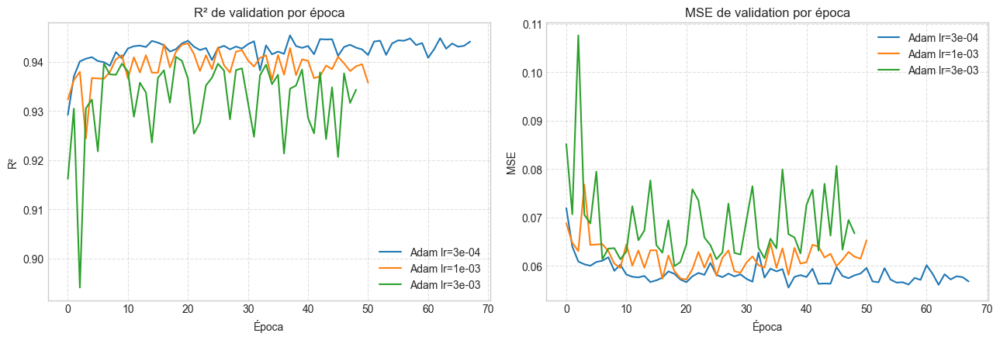

Mejor learning rate por validation: 3e-04


In [592]:
# Experimento controlado: solo cambia el learning rate de Adam.
# No se consulta test: la selección se hace exclusivamente con validation.
import pandas as pd
import copy
from sklearn.metrics import r2_score
from torch.utils.data import TensorDataset, DataLoader
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def entrenar_configuracion(learning_rate, paciencia=30, num_epochs=300):
    torch.manual_seed(SEED)
    modelo_local = MiRedNeuronal(
        n_entradas=len(features), clase_activacion=ACTIVACION
    ).to(device)
    optimizador_local = torch.optim.Adam(
        modelo_local.parameters(), lr=learning_rate, weight_decay=1e-4
    )
    criterio_local = nn.MSELoss()
    generador = torch.Generator().manual_seed(SEED)
    dataloader_local = DataLoader(
        TensorDataset(tensor_Xt, tensor_yt), batch_size=32,
        shuffle=True, generator=generador
    )

    mejor_r2, mejor_r2_train, mejor_epoca = float('-inf'), None, 0
    mejores_pesos, sin_mejora = None, 0
    historial = {'loss_train': [], 'loss_val': [], 'r2_train': [], 'r2_val': []}

    for epoca in range(1, num_epochs + 1):
        modelo_local.train()
        for batch_X, batch_y in dataloader_local:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            optimizador_local.zero_grad()
            loss = criterio_local(modelo_local(batch_X), batch_y)
            loss.backward()
            optimizador_local.step()

        modelo_local.eval()
        with torch.no_grad():
            pred_train = modelo_local(tensor_Xt.to(device))
            pred_val = modelo_local(tensor_Xtst.to(device))
            loss_train = criterio_local(pred_train, tensor_yt.to(device)).item()
            loss_val = criterio_local(pred_val, tensor_ytst.to(device)).item()
        r2_train_local = r2_score(tensor_yt.cpu().numpy(), pred_train.cpu().numpy())
        r2_val_local = r2_score(tensor_ytst.cpu().numpy(), pred_val.cpu().numpy())
        historial['loss_train'].append(loss_train)
        historial['loss_val'].append(loss_val)
        historial['r2_train'].append(r2_train_local)
        historial['r2_val'].append(r2_val_local)

        if r2_val_local > mejor_r2:
            mejor_r2, mejor_r2_train, mejor_epoca = r2_val_local, r2_train_local, epoca
            mejores_pesos = copy.deepcopy(modelo_local.state_dict())
            sin_mejora = 0
        else:
            sin_mejora += 1
            if sin_mejora >= paciencia:
                break

    modelo_local.load_state_dict(mejores_pesos)
    return modelo_local, historial, mejor_r2_train, mejor_r2, mejor_epoca

learning_rates = [3e-4, 1e-3, 3e-3]
resultados_lr, historiales_lr = [], {}
mejor_modelo, mejor_historial = None, None
mejor_r2_global = float('-inf')

for lr in learning_rates:
    candidato, historial, r2_train_lr, r2_val_lr, epoca_lr = entrenar_configuracion(lr)
    historiales_lr[lr] = historial
    resultados_lr.append({
        'Activación': ACTIVACION.__name__, 'Optimizador': 'Adam',
        'Learning rate': lr, 'R² train': r2_train_lr,
        'Mejor R² validation': r2_val_lr, 'Mejor época': epoca_lr
    })
    if r2_val_lr > mejor_r2_global:
        mejor_r2_global, mejor_modelo, mejor_historial = r2_val_lr, candidato, historial

tabla_resultados_lr = pd.DataFrame(resultados_lr).sort_values('Learning rate')
display(tabla_resultados_lr.style.hide(axis='index'))

# Las curvas conservan la evidencia de las tres configuraciones evaluadas.
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
for lr, historial in historiales_lr.items():
    axes[0].plot(historial['r2_val'], label=f'Adam lr={lr:.0e}')
    axes[1].plot(historial['loss_val'], label=f'Adam lr={lr:.0e}')
axes[0].set(title='R² de validation por época', xlabel='Época', ylabel='R²')
axes[1].set(title='MSE de validation por época', xlabel='Época', ylabel='MSE')
for ax in axes:
    ax.legend(); ax.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# El mejor modelo queda disponible para las celdas posteriores de evaluación.
modelo = mejor_modelo
historial_loss_train = mejor_historial['loss_train']
historial_loss_val = mejor_historial['loss_val']
historial_r2_train = mejor_historial['r2_train']
historial_r2_val = mejor_historial['r2_val']
fila_ganadora = tabla_resultados_lr.loc[tabla_resultados_lr['Mejor R² validation'].idxmax()]
print(f"Mejor learning rate por validation: {fila_ganadora['Learning rate']:.0e}")


### Decisión de learning rate

Con ELU, Adam y el resto de las condiciones fijas, se comparan tres learning rates usando exclusivamente validation. Se elige el que maximiza R²; el conjunto de test permanece reservado y no interviene en esta decisión.

### Vamos ahora a ver como predice el modelo

In [593]:
tensor_Xtst = tensor_Xtst.to(device)
modelo.eval()
with torch.no_grad():
    prediccion = modelo(tensor_Xtst)
    print(prediccion[:5])
    print(prediccion.shape)


tensor([[-0.6639],
        [-0.9149],
        [-0.7303],
        [ 0.2952],
        [ 1.4696]])
torch.Size([1115, 1])


R² entrenamiento: 0.9581
R² validation:    0.9453
R² test final:    0.9473


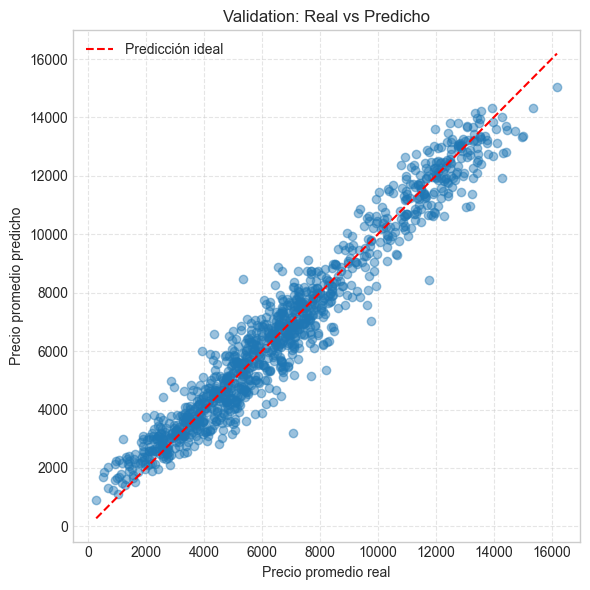

In [594]:
from sklearn.metrics import r2_score

modelo.eval()

with torch.no_grad():
    pred_train_scaled = modelo(tensor_Xt.to(device)).cpu().numpy()
    pred_val_scaled = modelo(tensor_Xtst.to(device)).cpu().numpy()
    pred_test_scaled = modelo(tensor_Xtest.to(device)).cpu().numpy()

y_train_original = scaler_y.inverse_transform(tensor_yt.cpu().numpy())
y_val_original = scaler_y.inverse_transform(tensor_ytst.cpu().numpy())
y_test_original = scaler_y.inverse_transform(tensor_ytest.cpu().numpy())

pred_train_original = scaler_y.inverse_transform(pred_train_scaled)
pred_val_original = scaler_y.inverse_transform(pred_val_scaled)
pred_test_original = scaler_y.inverse_transform(pred_test_scaled)

r2_train = r2_score(y_train_original, pred_train_original)
r2_val = r2_score(y_val_original, pred_val_original)
r2_test = r2_score(y_test_original, pred_test_original)

print(f"R² entrenamiento: {r2_train:.4f}")
print(f"R² validation:    {r2_val:.4f}")
print(f"R² test final:    {r2_test:.4f}")

# Scatter Real vs Predicho en validation.
plt.figure(figsize=(6, 6))
plt.scatter(y_val_original, pred_val_original, alpha=0.45)
limite_min = min(y_val_original.min(), pred_val_original.min())
limite_max = max(y_val_original.max(), pred_val_original.max())
plt.plot([limite_min, limite_max], [limite_min, limite_max], 'r--', label='Predicción ideal')
plt.xlabel('Precio promedio real')
plt.ylabel('Precio promedio predicho')
plt.title('Validation: Real vs Predicho')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## 2C) Explicación del proceso iterativo para conseguir los mejores resultados
Para mejorar el desempeño de la MLP se trabajó de forma iterativa, modificando un aspecto por vez y evaluando siempre con el conjunto de validación. Primero se normalizaron las variables de entrada utilizando únicamente los datos de entrenamiento, para evitar que las escalas distintas afectaran el aprendizaje. Luego se incorporaron variables de comportamiento de compra y proporciones por categoría, buscando aportar información útil sin incluir el monto de compra como predictor (La incorporación de las variables se analizó junto con el EDA, revisando los grados de asociación entre variables, tanto categoricas como numéricas).
Con la arquitectura requerida de cinco capas ocultas se probaron distintas funciones de activación y configuraciones de entrenamiento. ELU obtuvo un R² de validación levemente superior a ReLU (Ver Tabla comparativa mas arriba), por lo que se seleccionó como activación final. Después se evaluaron distintos learning rates para Adam, manteniendo fija la semilla, la arquitectura de capas, el dropout y la regularización. El mejor resultado de validación se obtuvo con Adam y learning rate 3e-4.
La selección se realizó usando validación, no el conjunto de test. El test final se reservó para estimar el desempeño sobre datos no vistos una única vez. Los resultados obtenidos —R² de entrenamiento cercano a 0.96, validación alrededor de 0.945 y test cercano a 0.945— Llegando asi a pasar el —R² de 70 solicitado.